In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [3]:
data=pd.read_csv("data_sets/data1/Travel.csv")

In [5]:
data.head()

,CustomerID,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome
0,200000,1,41.0,Self Enquiry,3,6.0,Salaried,Female,3,3.0,Deluxe,3.0,Single,1.0,1,2,1,0.0,Manager,20993.0
1,200001,0,49.0,Company Invited,1,14.0,Salaried,Male,3,4.0,Deluxe,4.0,Divorced,2.0,0,3,1,2.0,Manager,20130.0
2,200002,1,37.0,Self Enquiry,1,8.0,Free Lancer,Male,3,4.0,Basic,3.0,Single,7.0,1,3,0,0.0,Executive,17090.0
3,200003,0,33.0,Company Invited,1,9.0,Salaried,Female,2,3.0,Basic,3.0,Divorced,2.0,1,5,1,1.0,Executive,17909.0
4,200004,0,NaN,Self Enquiry,1,8.0,Small Business,Male,2,3.0,Basic,4.0,Divorced,1.0,0,5,1,0.0,Executive,18468.0


In [6]:
data.tail()

,CustomerID,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome
4883,204883,1,49.0,Self Enquiry,3,9.0,Small Business,Male,3,5.0,Deluxe,4.0,Unmarried,2.0,1,1,1,1.0,Manager,26576.0
4884,204884,1,28.0,Company Invited,1,31.0,Salaried,Male,4,5.0,Basic,3.0,Single,3.0,1,3,1,2.0,Executive,21212.0
4885,204885,1,52.0,Self Enquiry,3,17.0,Salaried,Female,4,4.0,Standard,4.0,Married,7.0,0,1,1,3.0,Senior Manager,31820.0
4886,204886,1,19.0,Self Enquiry,3,16.0,Small Business,Male,3,4.0,Basic,3.0,Single,3.0,0,5,0,2.0,Executive,20289.0
4887,204887,1,36.0,Self Enquiry,1,14.0,Salaried,Male,4,4.0,Basic,4.0,Unmarried,3.0,1,3,1,2.0,Executive,24041.0


In [8]:
data.shape

(4888, 20)

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4888 entries, 0 to 4887
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CustomerID                4888 non-null   int64  
 1   ProdTaken                 4888 non-null   int64  
 2   Age                       4662 non-null   float64
 3   TypeofContact             4863 non-null   object 
 4   CityTier                  4888 non-null   int64  
 5   DurationOfPitch           4637 non-null   float64
 6   Occupation                4888 non-null   object 
 7   Gender                    4888 non-null   object 
 8   NumberOfPersonVisiting    4888 non-null   int64  
 9   NumberOfFollowups         4843 non-null   float64
 10  ProductPitched            4888 non-null   object 
 11  PreferredPropertyStar     4862 non-null   float64
 12  MaritalStatus             4888 non-null   object 
 13  NumberOfTrips             4748 non-null   float64
 14  Passport

In [11]:
data.isnull().sum()

CustomerID                    0
ProdTaken                     0
Age                         226
TypeofContact                25
CityTier                      0
DurationOfPitch             251
Occupation                    0
Gender                        0
NumberOfPersonVisiting        0
NumberOfFollowups            45
ProductPitched                0
PreferredPropertyStar        26
MaritalStatus                 0
NumberOfTrips               140
Passport                      0
PitchSatisfactionScore        0
OwnCar                        0
NumberOfChildrenVisiting     66
Designation                   0
MonthlyIncome               233
dtype: int64

In [12]:
num_data=[fea for fea in data.columns if data[fea].dtypes!='O']

In [13]:
cat_data=[fea for fea in data.columns if data[fea].dtypes=='O']

In [76]:
data.memory_usage()

Index                         128
CustomerID                  39104
ProdTaken                   39104
Age                         39104
TypeofContact               39104
CityTier                    39104
DurationOfPitch             39104
Occupation                  39104
Gender                      39104
NumberOfPersonVisiting      39104
NumberOfFollowups           39104
ProductPitched              39104
PreferredPropertyStar       39104
MaritalStatus               39104
NumberOfTrips               39104
Passport                    39104
PitchSatisfactionScore      39104
OwnCar                      39104
NumberOfChildrenVisiting    39104
Designation                 39104
MonthlyIncome               39104
dtype: int64

In [80]:
data['Occupation'].unique()

array(['Salaried', 'Free Lancer', 'Small Business', 'Large Business'],
      dtype=object)

In [83]:
data['Occupation'].value_counts()

Salaried          2368
Small Business    2084
Large Business     434
Free Lancer          2
Name: Occupation, dtype: int64

<AxesSubplot:xlabel='Occupation', ylabel='count'>

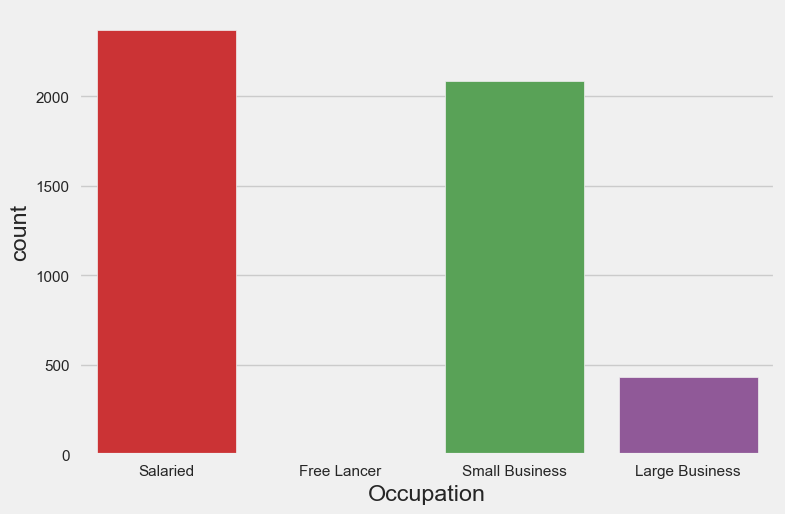

In [79]:
sns.countplot(data['Occupation'])

In [18]:
data.describe()

,CustomerID,ProdTaken,Age,CityTier,DurationOfPitch,NumberOfPersonVisiting,NumberOfFollowups,PreferredPropertyStar,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,MonthlyIncome
count,4888.000000,4888.000000,4662.000000,4888.000000,4637.000000,4888.000000,4843.000000,4862.000000,4748.000000,4888.000000,4888.000000,4888.000000,4822.000000,4655.000000
mean,202443.500000,0.188216,37.622265,1.654255,15.490835,2.905074,3.708445,3.581037,3.236521,0.290917,3.078151,0.620295,1.187267,23619.853491
std,1411.188388,0.390925,9.316387,0.916583,8.519643,0.724891,1.002509,0.798009,1.849019,0.454232,1.365792,0.485363,0.857861,5380.698361
min,200000.000000,0.000000,18.000000,1.000000,5.000000,1.000000,1.000000,3.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1000.000000
25%,201221.750000,0.000000,31.000000,1.000000,9.000000,2.000000,3.000000,3.000000,2.000000,0.000000,2.000000,0.000000,1.000000,20346.000000
50%,202443.500000,0.000000,36.000000,1.000000,13.000000,3.000000,4.000000,3.000000,3.000000,0.000000,3.000000,1.000000,1.000000,22347.000000
75%,203665.250000,0.000000,44.000000,3.000000,20.000000,3.000000,4.000000,4.000000,4.000000,1.000000,4.000000,1.000000,2.000000,25571.000000
max,204887.000000,1.000000,61.000000,3.000000,127.000000,5.000000,6.000000,5.000000,22.000000,1.000000,5.000000,1.000000,3.000000,98678.000000


In [20]:
data.corr()

,CustomerID,ProdTaken,Age,CityTier,DurationOfPitch,NumberOfPersonVisiting,NumberOfFollowups,PreferredPropertyStar,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,MonthlyIncome
CustomerID,1.000000,0.056506,0.032127,0.012975,0.064298,0.604013,0.427539,0.010553,0.224848,0.007974,-0.035847,0.003805,0.511763,0.276833
ProdTaken,0.056506,1.000000,-0.147254,0.086852,0.078257,0.009627,0.112171,0.099577,0.018898,0.260844,0.051394,-0.011508,0.007421,-0.130585
Age,0.032127,-0.147254,1.000000,-0.015625,-0.012063,0.011621,-0.002577,-0.010474,0.184905,0.033399,0.018510,0.048654,0.007370,0.464869
CityTier,0.012975,0.086852,-0.015625,1.000000,0.022703,-0.001671,0.023652,-0.009164,-0.029709,0.001793,-0.042160,0.003817,0.000672,0.051817
DurationOfPitch,0.064298,0.078257,-0.012063,0.022703,1.000000,0.065141,0.009434,-0.006637,0.009715,0.033034,-0.002880,-0.001626,0.031408,-0.006252
NumberOfPersonVisiting,0.604013,0.009627,0.011621,-0.001671,0.065141,1.000000,0.328569,0.033867,0.195223,0.011177,-0.019581,0.010362,0.610621,0.195134
NumberOfFollowups,0.427539,0.112171,-0.002577,0.023652,0.009434,0.328569,1.000000,-0.024176,0.139517,0.004970,0.004054,0.012112,0.286425,0.176503
PreferredPropertyStar,0.010553,0.099577,-0.010474,-0.009164,-0.006637,0.033867,-0.024176,1.000000,0.012115,0.001040,-0.022701,0.015742,0.035798,0.014289
NumberOfTrips,0.224848,0.018898,0.184905,-0.029709,0.009715,0.195223,0.139517,0.012115,1.000000,0.012949,-0.004378,-0.011825,0.168795,0.139105
Passport,0.007974,0.260844,0.033399,0.001793,0.033034,0.011177,0.004970,0.001040,0.012949,1.000000,0.002926,-0.022330,0.020264,0.002545


In [22]:
data.cov()

,CustomerID,ProdTaken,Age,CityTier,DurationOfPitch,NumberOfPersonVisiting,NumberOfFollowups,PreferredPropertyStar,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,MonthlyIncome
CustomerID,1.991453e+06,31.172498,422.205754,16.782689,773.284086,617.879272,604.836139,11.875750,585.792362,5.111316,-69.092081,2.606098,620.088972,2.101033e+06
ProdTaken,3.117250e+01,0.152822,-0.535959,0.031120,0.260897,0.002728,0.043969,0.031050,0.013743,0.046318,0.027440,-0.002184,0.002494,-2.760977e+02
Age,4.222058e+02,-0.535959,86.795067,-0.134168,-0.944440,0.078126,-0.024058,-0.077447,3.158372,0.141269,0.235235,0.220050,0.058470,2.336518e+04
CityTier,1.678269e+01,0.031120,-0.134168,0.840125,0.176544,-0.001110,0.021716,-0.006707,-0.050474,0.000747,-0.052778,0.001698,0.000529,2.559460e+02
DurationOfPitch,7.732841e+02,0.260897,-0.944440,0.176544,72.584310,0.401434,0.080699,-0.045149,0.154174,0.128118,-0.033569,-0.006731,0.229346,-2.891828e+02
NumberOfPersonVisiting,6.178793e+02,0.002728,0.078126,-0.001110,0.401434,0.525466,0.238479,0.019575,0.261809,0.003680,-0.019386,0.003646,0.380176,7.565188e+02
NumberOfFollowups,6.048361e+02,0.043969,-0.024058,0.021716,0.080699,0.238479,1.005024,-0.019309,0.259783,0.002265,0.005550,0.005894,0.246696,9.580277e+02
PreferredPropertyStar,1.187575e+01,0.031050,-0.077447,-0.006707,-0.045149,0.019575,-0.019309,0.636818,0.017840,0.000377,-0.024736,0.006102,0.024441,5.884892e+01
NumberOfTrips,5.857924e+02,0.013743,3.158372,-0.050474,0.154174,0.261809,0.259783,0.017840,3.418872,0.010882,-0.011035,-0.010622,0.267269,1.265226e+03
Passport,5.111316e+00,0.046318,0.141269,0.000747,0.128118,0.003680,0.002265,0.000377,0.010882,0.206326,0.001815,-0.004923,0.007898,6.230027e+00


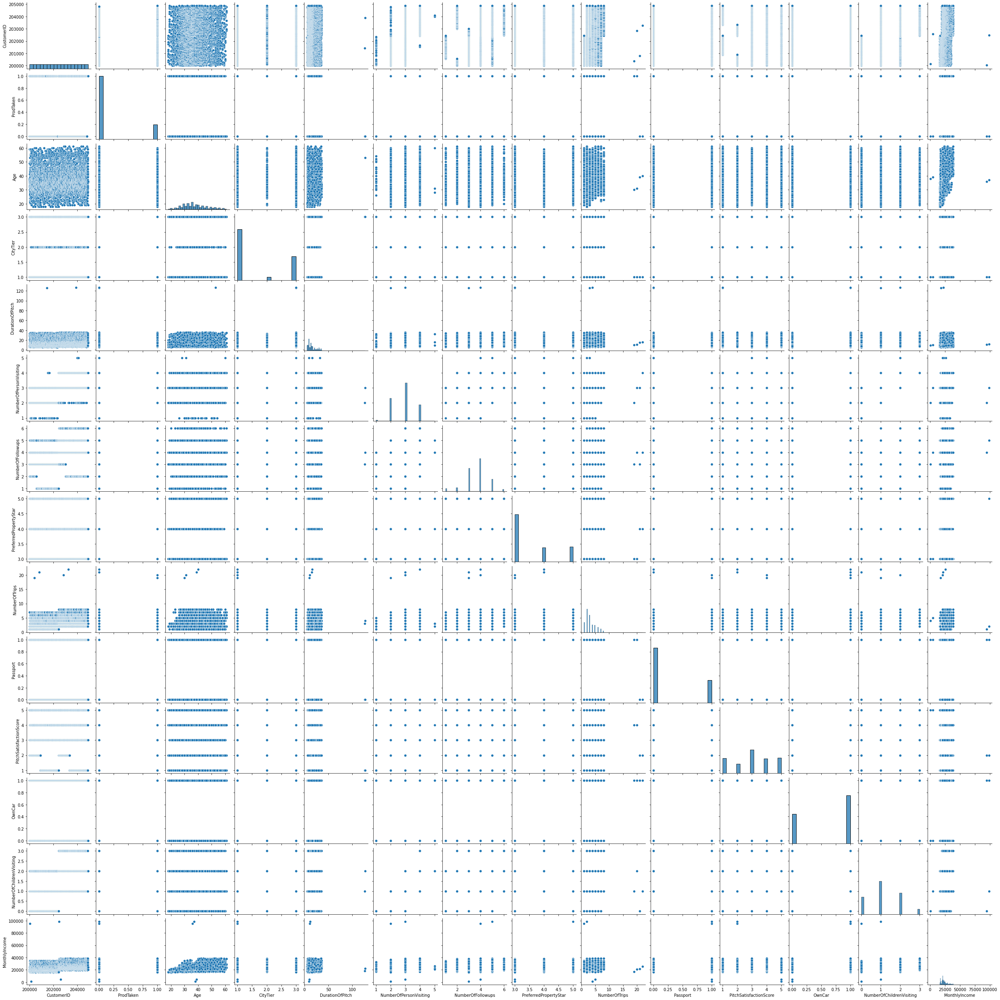

In [24]:
sns.pairplot(data)

In [26]:
import sweetviz
my_report  = sweetviz.analyze([data,'train'])
my_report.show_html('FinalReport.html')

                                             |          | [  0%]   00:00 -> (? left)

Report FinalReport.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine
Shape of your Data Set loaded: (4888, 20)
#######################################################################################
######################## C L A S S 

,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
CustomerID,4888,int64,0,0.000000,100.000000,0,possible ID column: drop
MonthlyIncome,2475,float64,233,4.766776,50.634206,0,"fill missing, skewed: cap or drop outliers"
Age,44,float64,226,4.623568,0.900164,0,fill missing
DurationOfPitch,34,float64,251,5.135025,0.695581,0,"fill missing, skewed: cap or drop outliers"
NumberOfTrips,12,float64,140,2.864157,0.245499,0,"fill missing, skewed: cap or drop outliers"
NumberOfFollowups,6,float64,45,0.920622,0.122750,0,fill missing
Designation,5,object,0,0.000000,0.102291,230,
PitchSatisfactionScore,5,int64,0,0.000000,0.102291,0,
ProductPitched,5,object,0,0.000000,0.102291,230,
NumberOfPersonVisiting,5,int64,0,0.000000,0.102291,0,


    20 Predictors classified...
        1 variables removed since they were ID or low-information variables
        List of variables removed: ['CustomerID']
Number of All Scatter Plots = 28
Could not draw Distribution Plot
All Plots done
Time to run AutoViz = 8 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


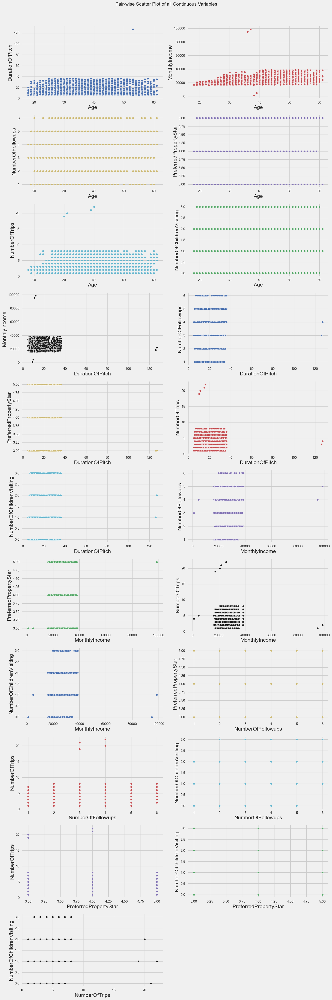

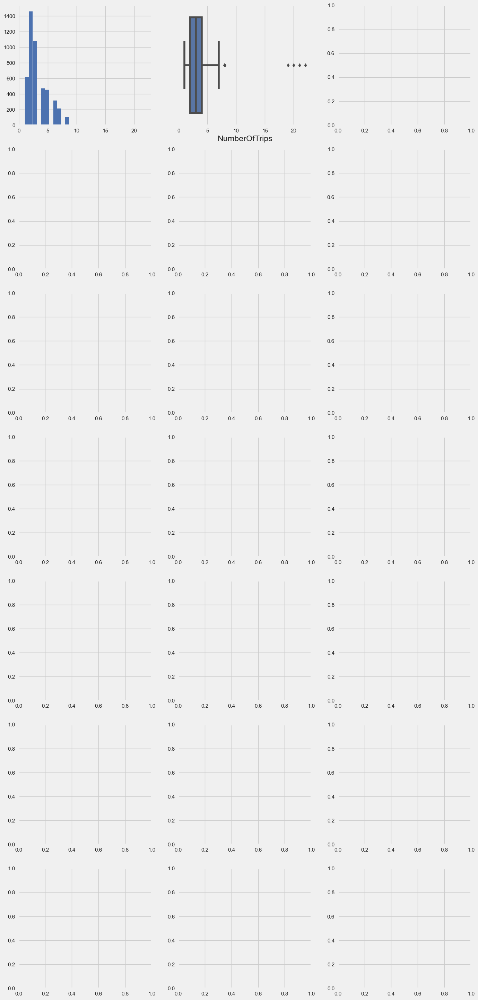

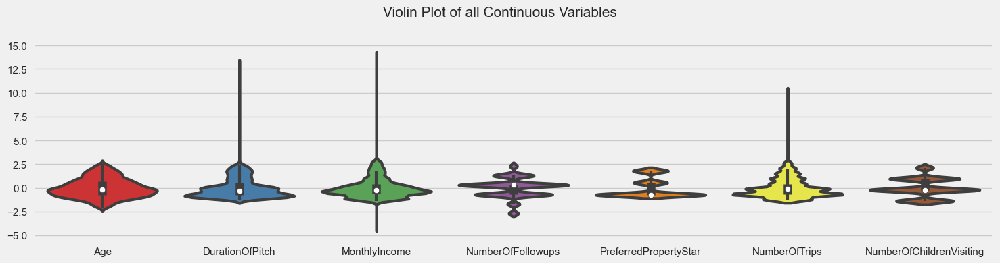

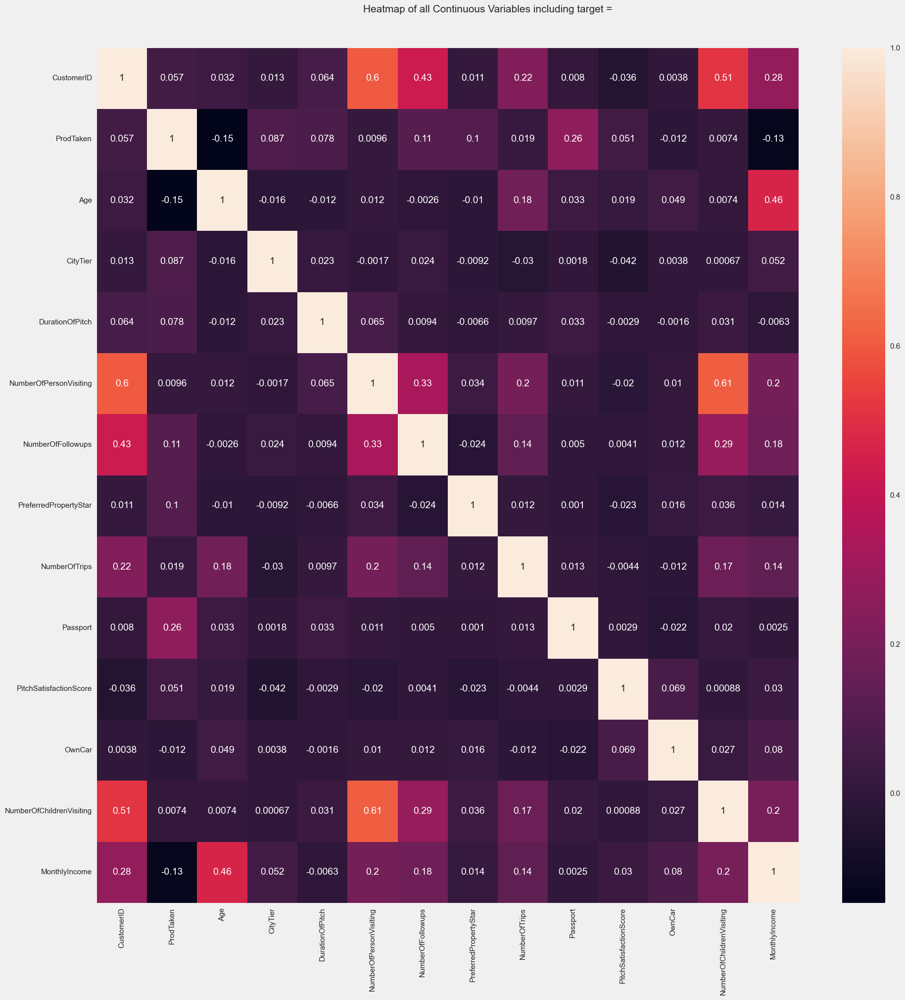

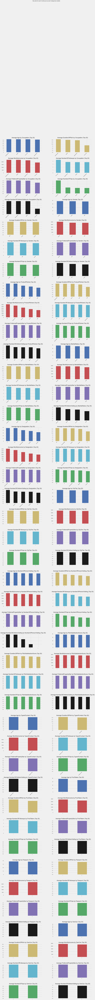

In [27]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
df=AV.AutoViz("data_sets/data1/Travel.csv")

<AxesSubplot:xlabel='Gender', ylabel='count'>

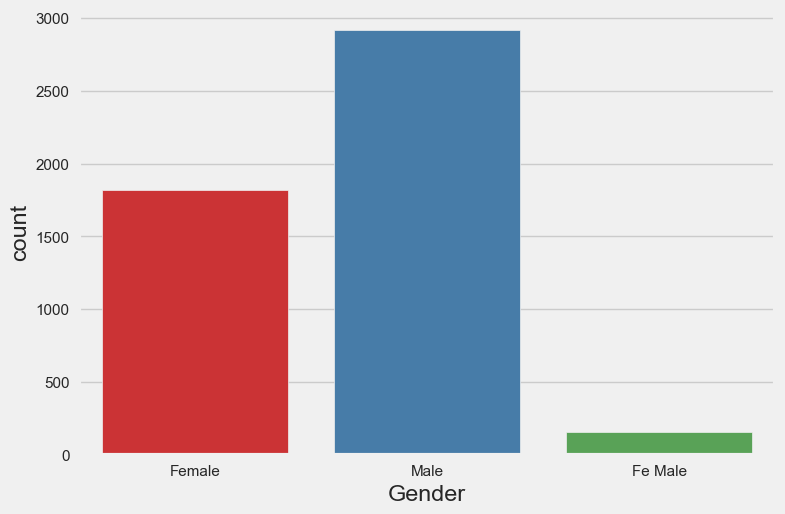

In [29]:
sns.countplot(data['Gender'])

In [31]:
data['Gender'].value_counts()

Male       2916
Female     1817
Fe Male     155
Name: Gender, dtype: int64

In [34]:
data['MaritalStatus'].value_counts()

Married      2340
Divorced      950
Single        916
Unmarried     682
Name: MaritalStatus, dtype: int64

<AxesSubplot:xlabel='MaritalStatus', ylabel='count'>

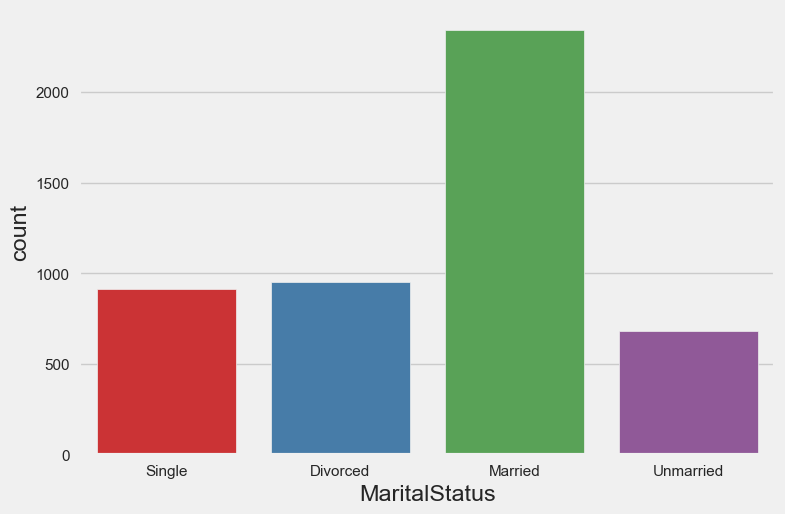

In [36]:
sns.countplot(data['MaritalStatus'])

<AxesSubplot:xlabel='Age', ylabel='Density'>

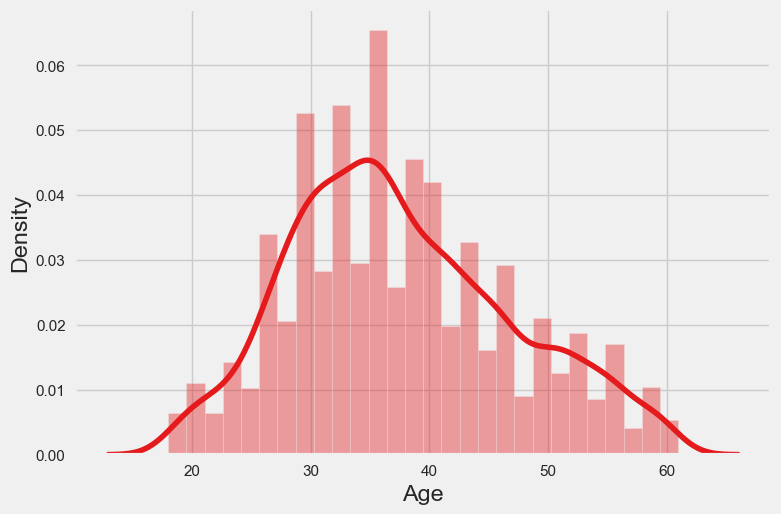

In [38]:
sns.distplot(data['Age'])

In [40]:
data['Age'].skew()

0.38298868373855377

<AxesSubplot:xlabel='Age', ylabel='MonthlyIncome'>

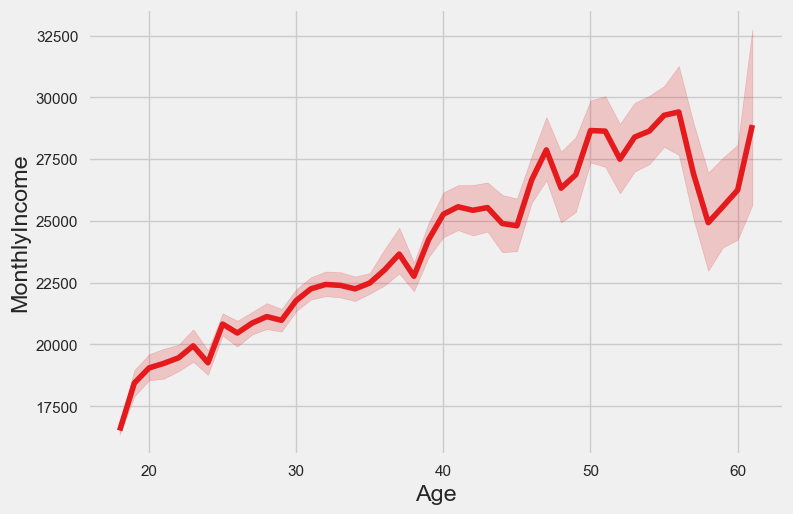

In [85]:
sns.lineplot(data=data,x="Age",y="MonthlyIncome")

<AxesSubplot:xlabel='MonthlyIncome', ylabel='Density'>

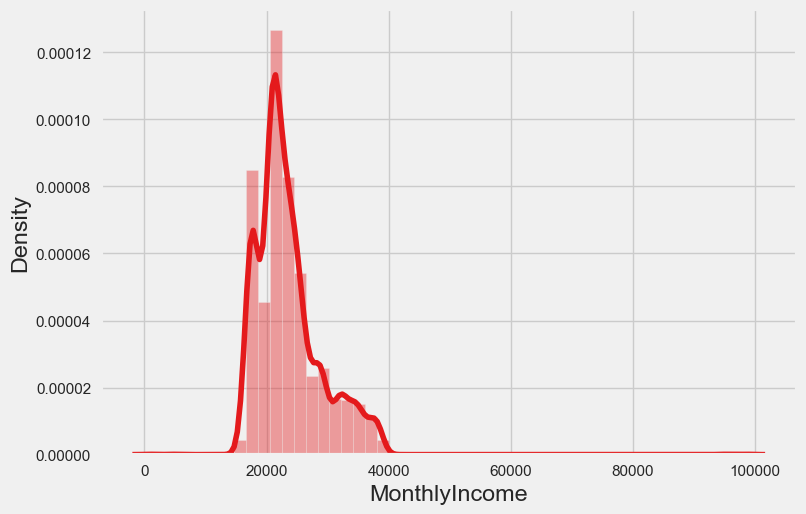

In [74]:
sns.distplot(data["MonthlyIncome"])

In [75]:
data["MonthlyIncome"].skew()

1.949159831766865